In [1]:
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import rasterio

# ============================================
# EarthVision AI - Project Configuration
# ============================================

PROJECT_ROOT = Path("/mnt/d/pocs/EarthVisionAI")

OSCD_ROOT = (
    PROJECT_ROOT
    / "data/raw/oscd"
    / "Onera Satellite Change Detection dataset - Images"
)

LOCATION = "abudhabi"

DATE_1 = OSCD_ROOT / LOCATION / "imgs_1_rect"
DATE_2 = OSCD_ROOT / LOCATION / "imgs_2_rect"

RESULTS_DIR = PROJECT_ROOT / "results/oscd" / LOCATION
RESULTS_DIR.mkdir(parents=True, exist_ok=True)

print("EarthVision AI - OSCD Analysis")
print("=" * 40)
print(f"Project   : {PROJECT_ROOT}")
print(f"Location  : {LOCATION}")
print(f"Date 1    : {DATE_1}")
print(f"Date 2    : {DATE_2}")
print(f"Results   : {RESULTS_DIR}")

EarthVision AI - OSCD Analysis
Project   : /mnt/d/pocs/EarthVisionAI
Location  : abudhabi
Date 1    : /mnt/d/pocs/EarthVisionAI/data/raw/oscd/Onera Satellite Change Detection dataset - Images/abudhabi/imgs_1_rect
Date 2    : /mnt/d/pocs/EarthVisionAI/data/raw/oscd/Onera Satellite Change Detection dataset - Images/abudhabi/imgs_2_rect
Results   : /mnt/d/pocs/EarthVisionAI/results/oscd/abudhabi


In [2]:
# ============================================
# Cell 2 - Load Sentinel-2 Bands
# ============================================

BANDS = [
    "B01", "B02", "B03", "B04",
    "B05", "B06", "B07", "B08",
    "B8A", "B09", "B10", "B11", "B12"
]


def load_bands(folder):
    """Load all Sentinel-2 bands into a dictionary."""

    bands = {}

    for band_name in BANDS:
        path = folder / f"{band_name}.tif"

        with rasterio.open(path) as src:
            bands[band_name] = src.read(1)

    return bands


# Load both dates
image_1 = load_bands(DATE_1)
image_2 = load_bands(DATE_2)


# Verify
print("Date 1")
print("-" * 40)

for band, data in image_1.items():
    print(f"{band:>3}: shape={data.shape}, dtype={data.dtype}")


print("\nDate 2")
print("-" * 40)

for band, data in image_2.items():
    print(f"{band:>3}: shape={data.shape}, dtype={data.dtype}")

/mnt/d/pocs/EarthVisionAI/.venv/lib/python3.12/site-packages/rasterio/__init__.py:367: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Date 1
----------------------------------------
B01: shape=(799, 785), dtype=uint16
B02: shape=(799, 785), dtype=uint16
B03: shape=(799, 785), dtype=uint16
B04: shape=(799, 785), dtype=uint16
B05: shape=(799, 785), dtype=uint16
B06: shape=(799, 785), dtype=uint16
B07: shape=(799, 785), dtype=uint16
B08: shape=(799, 785), dtype=uint16
B8A: shape=(799, 785), dtype=uint16
B09: shape=(799, 785), dtype=uint16
B10: shape=(799, 785), dtype=uint16
B11: shape=(799, 785), dtype=uint16
B12: shape=(799, 785), dtype=uint16

Date 2
----------------------------------------
B01: shape=(799, 785), dtype=uint16
B02: shape=(799, 785), dtype=uint16
B03: shape=(799, 785), dtype=uint16
B04: shape=(799, 785), dtype=uint16
B05: shape=(799, 785), dtype=uint16
B06: shape=(799, 785), dtype=uint16
B07: shape=(799, 785), dtype=uint16
B08: shape=(799, 785), dtype=uint16
B8A: shape=(799, 785), dtype=uint16
B09: shape=(799, 785), dtype=uint16
B10: shape=(799, 785), dtype=uint16
B11: shape=(799, 785), dtype=uint16
B12

In [3]:
# ============================================
# Cell 3 - Build RGB Satellite Images
# ============================================

def normalize_for_display(image, lower=2, upper=98):
    """
    Convert raw Sentinel-2 uint16 values into
    0-1 values suitable for visualization.
    """
    low = np.percentile(image, lower)
    high = np.percentile(image, upper)

    image = np.clip(image, low, high)

    return (image - low) / (high - low)


def create_rgb(image):
    """Create an RGB image from Sentinel-2 bands."""

    red = normalize_for_display(image["B04"])
    green = normalize_for_display(image["B03"])
    blue = normalize_for_display(image["B02"])

    return np.dstack([red, green, blue])


rgb_1 = create_rgb(image_1)
rgb_2 = create_rgb(image_2)

print("RGB Date 1:", rgb_1.shape)
print("RGB Date 2:", rgb_2.shape)
print("Value range:", rgb_1.min(), "to", rgb_1.max())

RGB Date 1: (799, 785, 3)
RGB Date 2: (799, 785, 3)
Value range: 0.0 to 1.0


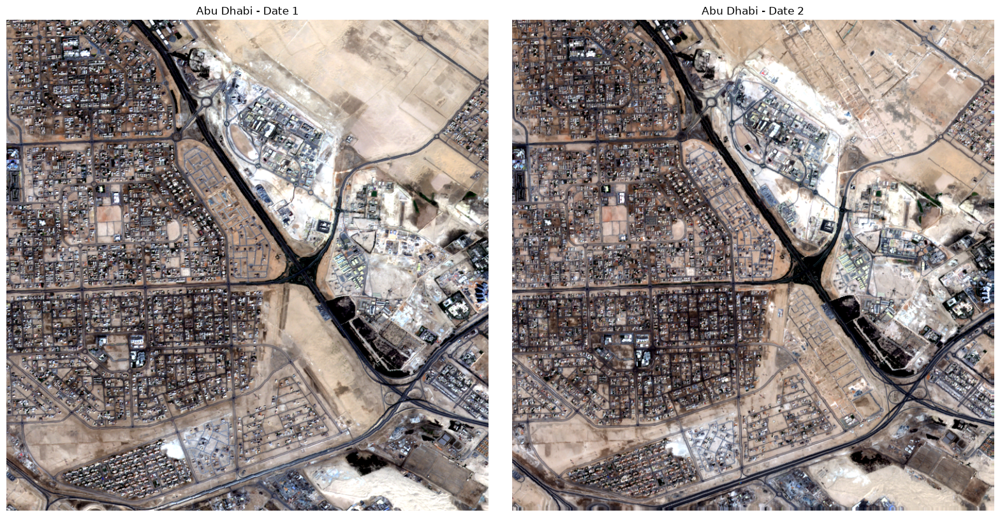

Saved visualization to: /mnt/d/pocs/EarthVisionAI/results/oscd/abudhabi/abudhabi_before_after_rgb.png


In [4]:
# ============================================
# Cell 4 - Visual Before / After Comparison
# ============================================

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes[0].imshow(rgb_1)
axes[0].set_title("Abu Dhabi - Date 1")
axes[0].axis("off")

axes[1].imshow(rgb_2)
axes[1].set_title("Abu Dhabi - Date 2")
axes[1].axis("off")

plt.tight_layout()

output_path = RESULTS_DIR / "abudhabi_before_after_rgb.png"
plt.savefig(output_path, dpi=150, bbox_inches="tight")

plt.show()

print(f"Saved visualization to: {output_path}")

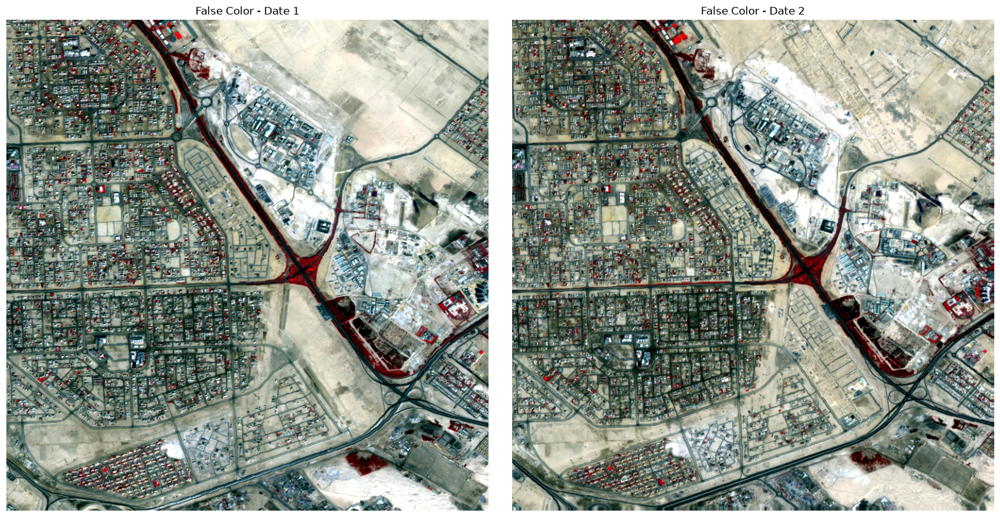

Saved visualization to: /mnt/d/pocs/EarthVisionAI/results/oscd/abudhabi/abudhabi_before_after_false_color.png


In [5]:
# ============================================
# Cell 5 - False Color / NIR Visualization
# ============================================

def create_false_color(image):
    """
    Create a false-color composite using:
        R = NIR  (B08)
        G = Red  (B04)
        B = Green (B03)
    """

    nir = normalize_for_display(image["B08"])
    red = normalize_for_display(image["B04"])
    green = normalize_for_display(image["B03"])

    return np.dstack([nir, red, green])


false_color_1 = create_false_color(image_1)
false_color_2 = create_false_color(image_2)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes[0].imshow(false_color_1)
axes[0].set_title("False Color - Date 1")
axes[0].axis("off")

axes[1].imshow(false_color_2)
axes[1].set_title("False Color - Date 2")
axes[1].axis("off")

plt.tight_layout()

output_path = RESULTS_DIR / "abudhabi_before_after_false_color.png"
plt.savefig(output_path, dpi=150, bbox_inches="tight")

plt.show()

print(f"Saved visualization to: {output_path}")

In [6]:
# ============================================
# Cell 6 - NDVI Analysis
# ============================================

def calculate_ndvi(image):
    """Calculate NDVI from Sentinel-2 B08 and B04."""

    nir = image["B08"].astype(np.float32)
    red = image["B04"].astype(np.float32)

    denominator = nir + red

    ndvi = np.divide(
        nir - red,
        denominator,
        out=np.zeros_like(nir, dtype=np.float32),
        where=denominator != 0
    )

    return ndvi


ndvi_1 = calculate_ndvi(image_1)
ndvi_2 = calculate_ndvi(image_2)

print("NDVI Date 1")
print(f"  Min  : {ndvi_1.min():.3f}")
print(f"  Max  : {ndvi_1.max():.3f}")
print(f"  Mean : {ndvi_1.mean():.3f}")
print(f"  Std  : {ndvi_1.std():.3f}")

print("\nNDVI Date 2")
print(f"  Min  : {ndvi_2.min():.3f}")
print(f"  Max  : {ndvi_2.max():.3f}")
print(f"  Mean : {ndvi_2.mean():.3f}")
print(f"  Std  : {ndvi_2.std():.3f}")

NDVI Date 1
  Min  : -0.276
  Max  : 0.698
  Mean : 0.051
  Std  : 0.056

NDVI Date 2
  Min  : -0.285
  Max  : 0.623
  Mean : 0.051
  Std  : 0.046


/tmp/ipykernel_207284/2766509055.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


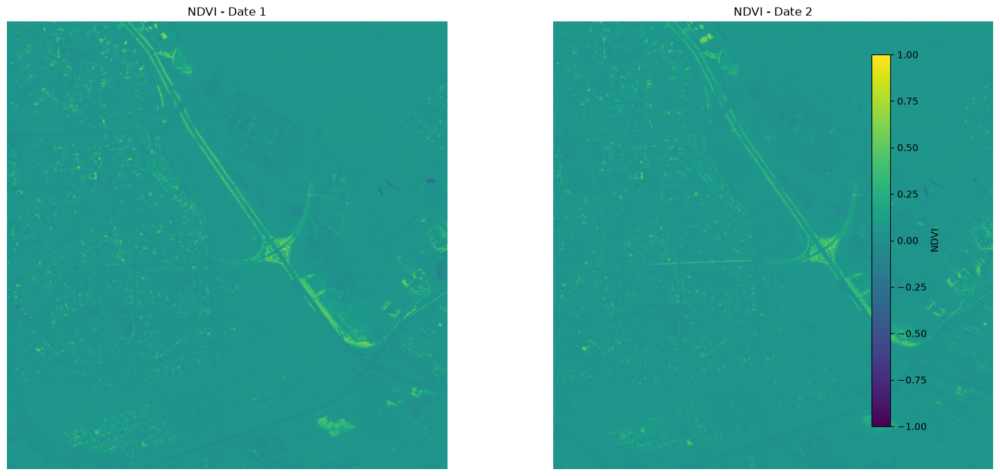

Saved visualization to: /mnt/d/pocs/EarthVisionAI/results/oscd/abudhabi/abudhabi_before_after_ndvi.png


In [7]:
# ============================================
# Cell 7 - NDVI Before / After
# ============================================

fig, axes = plt.subplots(1, 2, figsize=(16, 7))

im1 = axes[0].imshow(ndvi_1, vmin=-1, vmax=1)
axes[0].set_title("NDVI - Date 1")
axes[0].axis("off")

im2 = axes[1].imshow(ndvi_2, vmin=-1, vmax=1)
axes[1].set_title("NDVI - Date 2")
axes[1].axis("off")

fig.colorbar(im2, ax=axes, fraction=0.025, pad=0.02, label="NDVI")

plt.tight_layout()

output_path = RESULTS_DIR / "abudhabi_before_after_ndvi.png"
plt.savefig(output_path, dpi=150, bbox_inches="tight")

plt.show()

print(f"Saved visualization to: {output_path}")

In [8]:
# ============================================
# Cell 8 - Spectral Change Magnitude
# ============================================

# Convert selected bands to float
b04_1 = image_1["B04"].astype(np.float32)
b08_1 = image_1["B08"].astype(np.float32)

b04_2 = image_2["B04"].astype(np.float32)
b08_2 = image_2["B08"].astype(np.float32)

# Normalize each band independently for comparison
b04_1_n = normalize_for_display(b04_1)
b08_1_n = normalize_for_display(b08_1)

b04_2_n = normalize_for_display(b04_2)
b08_2_n = normalize_for_display(b08_2)

# Spectral difference
red_change = np.abs(b04_2_n - b04_1_n)
nir_change = np.abs(b08_2_n - b08_1_n)

# Combined change score
change_score = (red_change + nir_change) / 2

print("Change score")
print("-" * 40)
print(f"Shape : {change_score.shape}")
print(f"Min   : {change_score.min():.4f}")
print(f"Max   : {change_score.max():.4f}")
print(f"Mean  : {change_score.mean():.4f}")
print(f"Std   : {change_score.std():.4f}")

Change score
----------------------------------------
Shape : (799, 785)
Min   : 0.0000
Max   : 1.0000
Mean  : 0.1369
Std   : 0.1222


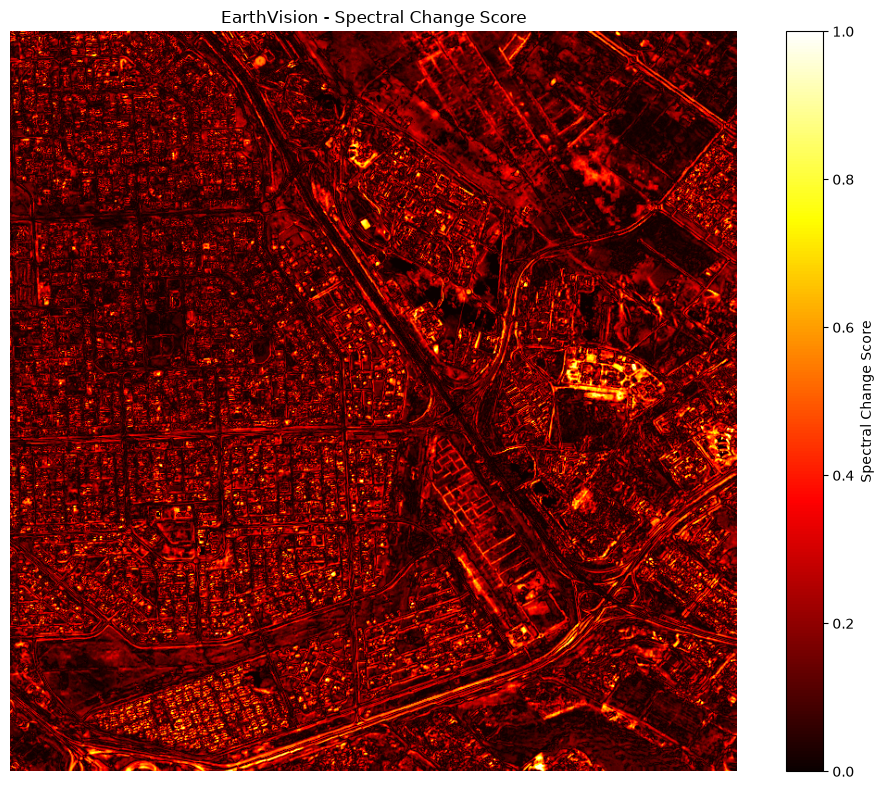

Saved visualization to: /mnt/d/pocs/EarthVisionAI/results/oscd/abudhabi/abudhabi_spectral_change_score.png


In [9]:
# ============================================
# Cell 9 - Change Score Visualization
# ============================================

plt.figure(figsize=(10, 8))

plt.imshow(change_score, cmap="hot")
plt.colorbar(label="Spectral Change Score")

plt.title("EarthVision - Spectral Change Score")
plt.axis("off")

plt.tight_layout()

output_path = RESULTS_DIR / "abudhabi_spectral_change_score.png"
plt.savefig(output_path, dpi=150, bbox_inches="tight")

plt.show()

print(f"Saved visualization to: {output_path}")

In [10]:
from PIL import Image
import numpy as np

path = (
    "data/raw/oscd/"
    "Onera Satellite Change Detection dataset - Train Labels/"
    "abudhabi/cm/cm.png"
)

arr = np.array(Image.open(path))

print("Shape     :", arr.shape)
print("Data type :", arr.dtype)
print("Unique    :", np.unique(arr))

values, counts = np.unique(arr, return_counts=True)

print("\nPixel distribution:")
for value, count in zip(values, counts):
    print(f"Class {value}: {count:,} pixels ({count / arr.size * 100:.2f}%)")

FileNotFoundError: [Errno 2] No such file or directory: 'data/raw/oscd/Onera Satellite Change Detection dataset - Train Labels/abudhabi/cm/cm.png'

In [ ]:
# ============================================
# Cell 10 - Save Satellite RGB for AI Model
# ============================================

rgb_uint8 = (rgb_1 * 255).astype(np.uint8)

rgb_path = RESULTS_DIR / "abudhabi_date1_rgb.png"

plt.imsave(rgb_path, rgb_uint8)

print(f"Satellite RGB saved to:")
print(rgb_path)
print(f"Image shape: {rgb_uint8.shape}")

In [2]:
# ============================================
# Cell 10 - Save Satellite RGB for AI Model
# ============================================

rgb_uint8 = (rgb_1 * 255).astype(np.uint8)

rgb_path = RESULTS_DIR / "abudhabi_date1_rgb.png"

plt.imsave(rgb_path, rgb_uint8)

print(f"Satellite RGB saved to:")
print(rgb_path)
print(f"Image shape: {rgb_uint8.shape}")

NameError: name 'rgb_1' is not defined